In [1]:
import os
import numpy as np
from tqdm import tqdm 
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.integrate import quad
from scipy.signal import find_peaks
from scipy.optimize import curve_fit
from scipy.integrate import solve_ivp

mpl.rc('figure', figsize=(12, 6))
mpl.rc('text', usetex = False)
mpl.rc('font', family = 'serif')
mpl.rc('font', size = '14')
mpl.rc('xtick', labelsize=14) 
mpl.rc('ytick', labelsize=14)
mpl.rcParams['mathtext.fontset'] = 'stix'

In [2]:
# Carga de archivos
dir_m2phi2_q6200 = "./data/var_q/q_6200/"
dir_m2phi2_q8400 = "./data/var_q/q_8400/"
dir_m2phi2_q9600 = "./data/var_q/q_9600/"
dir_m2phi2_q11000 = "./data/var_q/q_11000/"
dir_m2phi2_q13450 = "./data/var_q/q_13450/"
dir_m2phi2_q16780 = "./data/var_q/q_16780/"
dir_m2phi2_q17345 = "./data/var_q/q_17345/"
dir_m2phi2_q18900 = "./data/var_q/q_18900/"
dir_m2phi2_q20000 = "./data/var_q/q_20000/"
dir_m2phi2_q21780 = "./data/var_q/q_21780/"
dir_m2phi2_q22400 = "./data/var_q/q_22400/"
dir_m2phi2_q24160 = "./data/var_q/q_24160/"

# Scale factor $a(\tilde\eta)$

The file contains the following columns:

$\tilde\eta$ | $a$ | $a'$ | $\frac{a'}{a}$

In [3]:
def load_scale_factor(folder):
    return np.loadtxt(os.path.join(folder, "average_scale_factor.txt"))

# Load all scale factor datasets
aDat_m2phi2_q6200 = load_scale_factor(dir_m2phi2_q6200)
aDat_m2phi2_q8400 = load_scale_factor(dir_m2phi2_q8400)
aDat_m2phi2_q9600 = load_scale_factor(dir_m2phi2_q9600)
aDat_m2phi2_q11000 = load_scale_factor(dir_m2phi2_q11000)
aDat_m2phi2_q13450 = load_scale_factor(dir_m2phi2_q13450)
aDat_m2phi2_q16780 = load_scale_factor(dir_m2phi2_q16780)
aDat_m2phi2_q17345 = load_scale_factor(dir_m2phi2_q17345)
aDat_m2phi2_q18900 = load_scale_factor(dir_m2phi2_q18900)
aDat_m2phi2_q20000 = load_scale_factor(dir_m2phi2_q20000)
aDat_m2phi2_q21780 = load_scale_factor(dir_m2phi2_q21780)
aDat_m2phi2_q22400 = load_scale_factor(dir_m2phi2_q22400)
aDat_m2phi2_q24160 = load_scale_factor(dir_m2phi2_q24160)


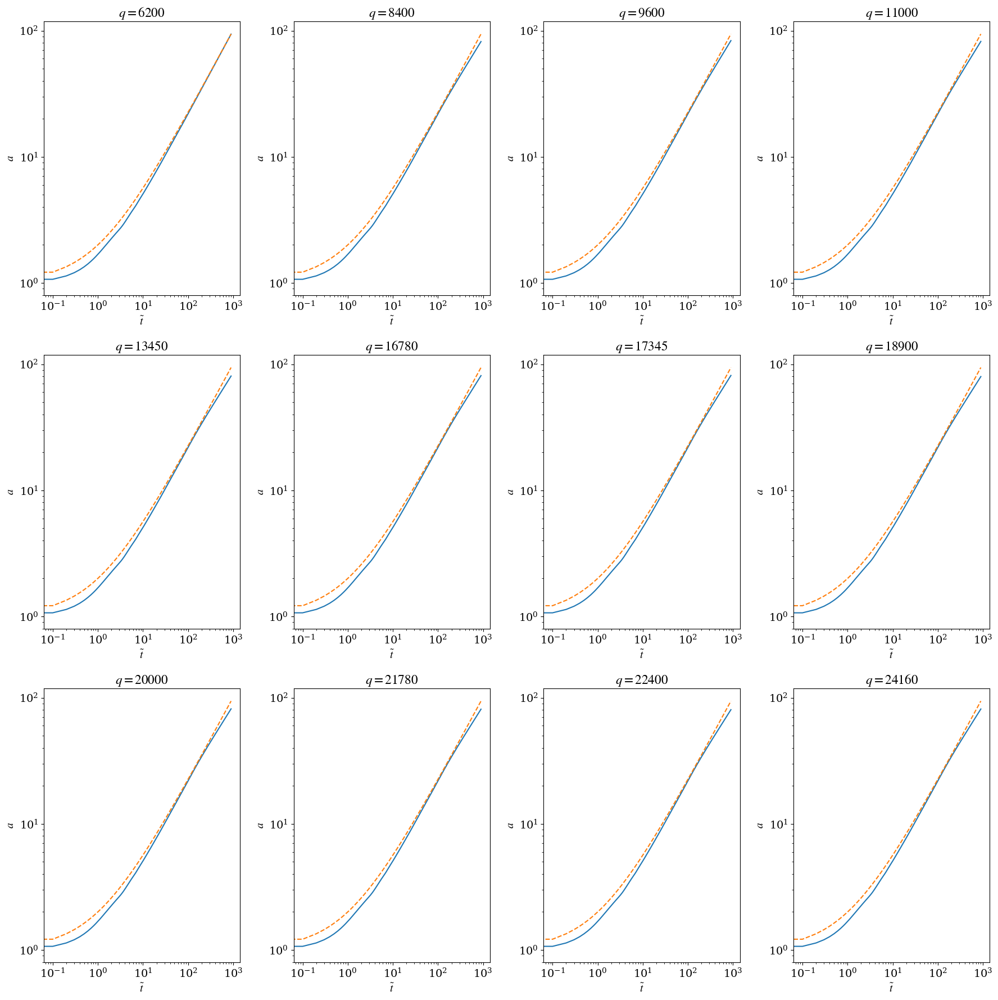

In [4]:
def plot_scale_factor_case(aDat_m2phi2, q_labels):
    plt.figure(figsize=(18, 18))

    # Tanh2 arriba
    for idx in range(12):
        plt.subplot(3, 4, idx+1)
        plt.plot(aDat_m2phi2[idx][:, 0], aDat_m2phi2[idx][:, 1])
        plt.plot(aDat_m2phi2[idx][:, 0], aDat_m2phi2[idx][:, 0]**(2/3) + 1, "--")
        plt.ylabel("$a$")
        plt.xlabel(r'$\tilde t$')
        plt.title(q_labels[idx])
        plt.xscale("log")
        plt.yscale("log")

    plt.tight_layout()
    plt.show()

q_labels = [
    r"$q = 6200$",
    r"$q = 8400$",
    r"$q = 9600$",
    r"$q = 11000$",
    r"$q = 13450$",
    r"$q = 16780$",
    r"$q = 17345$",
    r"$q = 18900$",
    r"$q = 20000$",
    r"$q = 21780$",
    r"$q = 22400$",
    r"$q = 24160$",
]

plot_scale_factor_case([aDat_m2phi2_q6200, aDat_m2phi2_q8400, aDat_m2phi2_q9600, aDat_m2phi2_q11000, aDat_m2phi2_q13450, aDat_m2phi2_q16780, aDat_m2phi2_q17345, aDat_m2phi2_q18900, aDat_m2phi2_q20000, aDat_m2phi2_q21780, aDat_m2phi2_q22400, aDat_m2phi2_q24160], q_labels)

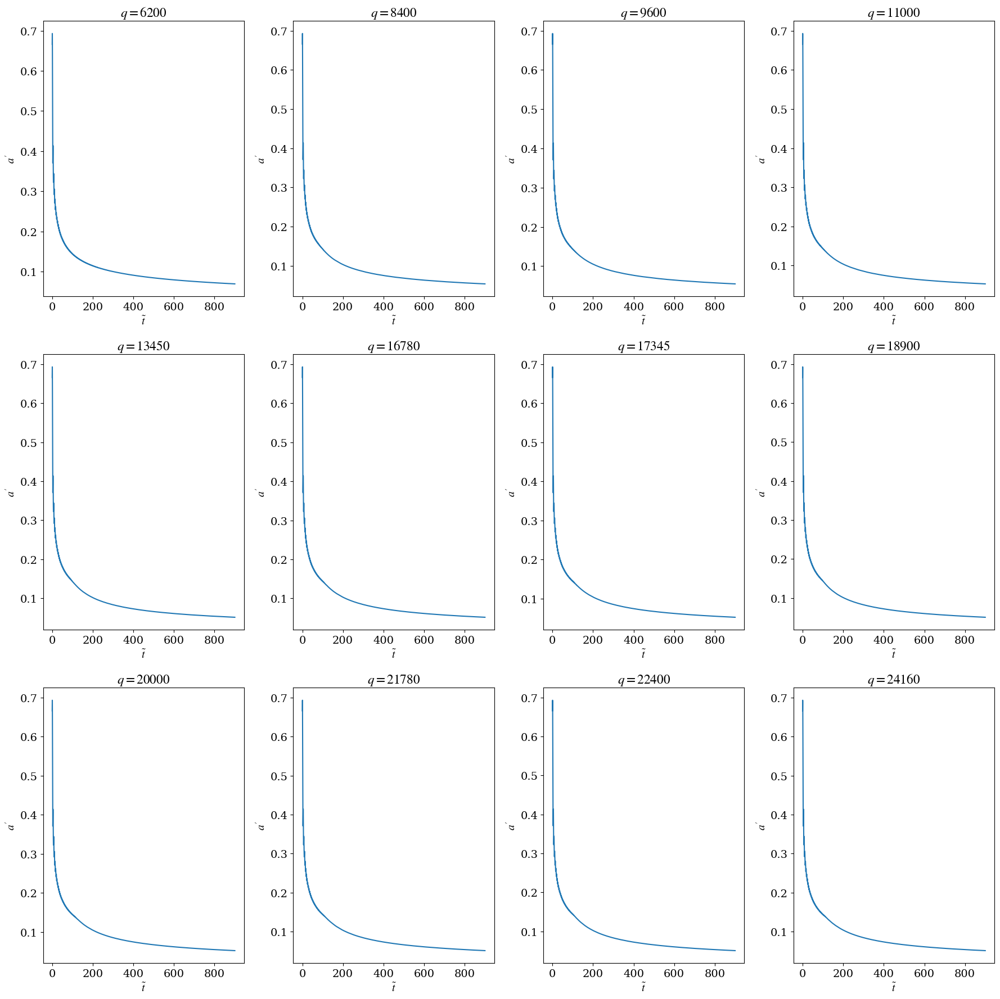

In [5]:
def plot_scale_factor_derivative_case(aDat_m2phi2, q_labels):
    plt.figure(figsize=(18, 18))

    # Tanh2 arriba
    for idx in range(12):
        plt.subplot(3, 4, idx+1)
        plt.plot(aDat_m2phi2[idx][:, 0], aDat_m2phi2[idx][:, 2])
        plt.ylabel("$a'$")
        plt.xlabel(r'$\tilde t$')
        plt.title(q_labels[idx])
    
    plt.tight_layout()
    plt.show()

q_labels = [
    r"$q = 6200$",
    r"$q = 8400$",
    r"$q = 9600$",
    r"$q = 11000$",
    r"$q = 13450$",
    r"$q = 16780$",
    r"$q = 17345$",
    r"$q = 18900$",
    r"$q = 20000$",
    r"$q = 21780$",
    r"$q = 22400$",
    r"$q = 24160$",
]

plot_scale_factor_derivative_case([aDat_m2phi2_q6200, aDat_m2phi2_q8400, aDat_m2phi2_q9600, aDat_m2phi2_q11000, aDat_m2phi2_q13450, aDat_m2phi2_q16780, aDat_m2phi2_q17345, aDat_m2phi2_q18900, aDat_m2phi2_q20000, aDat_m2phi2_q21780, aDat_m2phi2_q22400, aDat_m2phi2_q24160], q_labels)

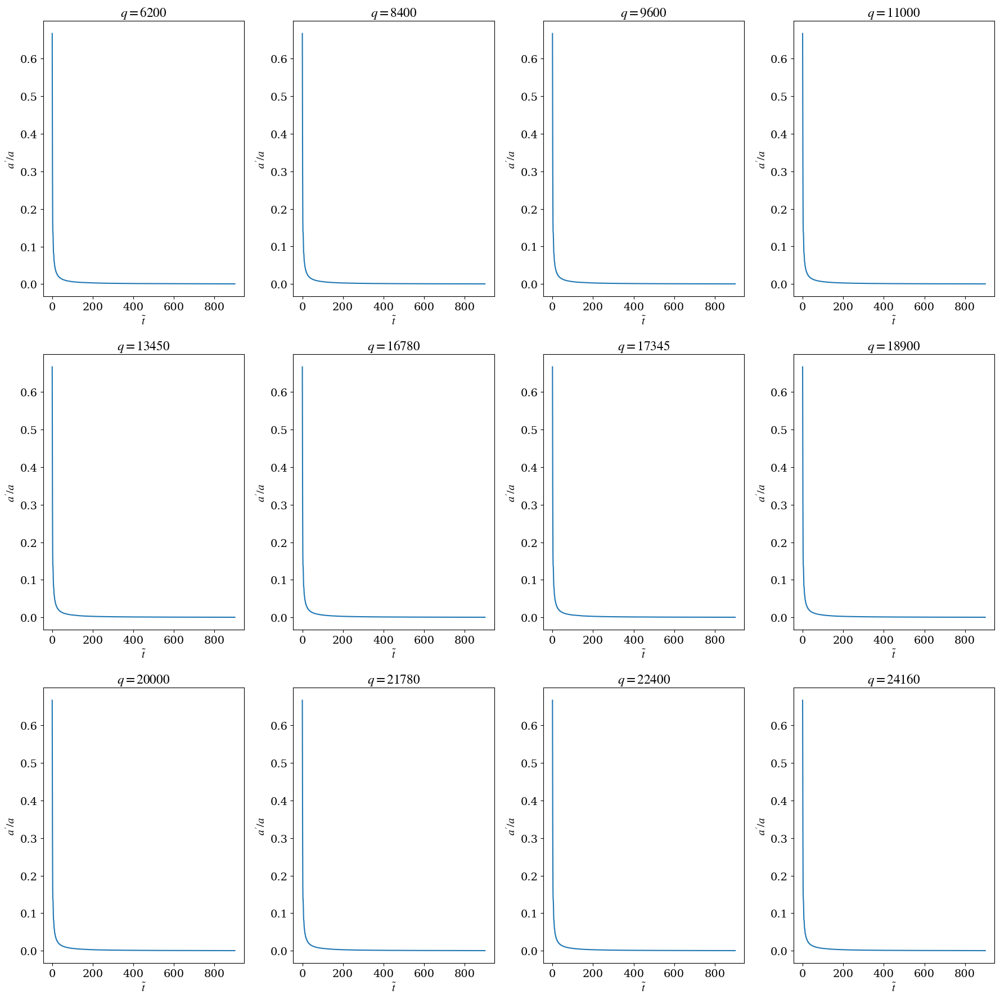

In [6]:
def plot_scale_factor_ratio_case(aDat_m2phi2, q_labels):
    plt.figure(figsize=(18, 18))

    # Tanh2 arriba
    for idx in range(12):
        plt.subplot(3, 4, idx+1)
        plt.plot(aDat_m2phi2[idx][:, 0], aDat_m2phi2[idx][:, 3])  # Cambia a [:, 3] para a'/a
        plt.ylabel("$a'/a$")
        plt.xlabel(r'$\tilde t$')
        plt.title(q_labels[idx])

    plt.tight_layout()
    plt.show()

q_labels = [
    r"$q = 6200$",
    r"$q = 8400$",
    r"$q = 9600$",
    r"$q = 11000$",
    r"$q = 13450$",
    r"$q = 16780$",
    r"$q = 17345$",
    r"$q = 18900$",
    r"$q = 20000$",
    r"$q = 21780$",
    r"$q = 22400$",
    r"$q = 24160$",
]

plot_scale_factor_ratio_case([aDat_m2phi2_q6200, aDat_m2phi2_q8400, aDat_m2phi2_q9600, aDat_m2phi2_q11000, aDat_m2phi2_q13450, aDat_m2phi2_q16780, aDat_m2phi2_q17345, aDat_m2phi2_q18900, aDat_m2phi2_q20000, aDat_m2phi2_q21780, aDat_m2phi2_q22400, aDat_m2phi2_q24160], q_labels)

# Volume average of fields

The files for the averages of the scalar fields contain the following columns:

$\eta$ | $\langle \tilde\phi_n \rangle$ | $\langle \tilde\phi'_n \rangle$ | $\langle \tilde\phi^2_n \rangle$ | $\langle \tilde\phi^{'2}_n \rangle$ | $\mathrm{rms}(\tilde\phi_n) $ | $\mathrm{rms}(\tilde\phi'_n) $

In [7]:
# Define a function for the plots, as we are gonna do 
# the same for both fields
def plot_fld(fldDat, fldNum="", aDat=None):
    plt.plot(fldDat[:,0], aDat[:,1] * fldDat[:,1])
    plt.xlabel("$\\tilde\eta$")
    plt.ylabel("$a\cdot\langle\phi_"+ fldNum +" \\rangle$")

## Field $0$ (inflaton)

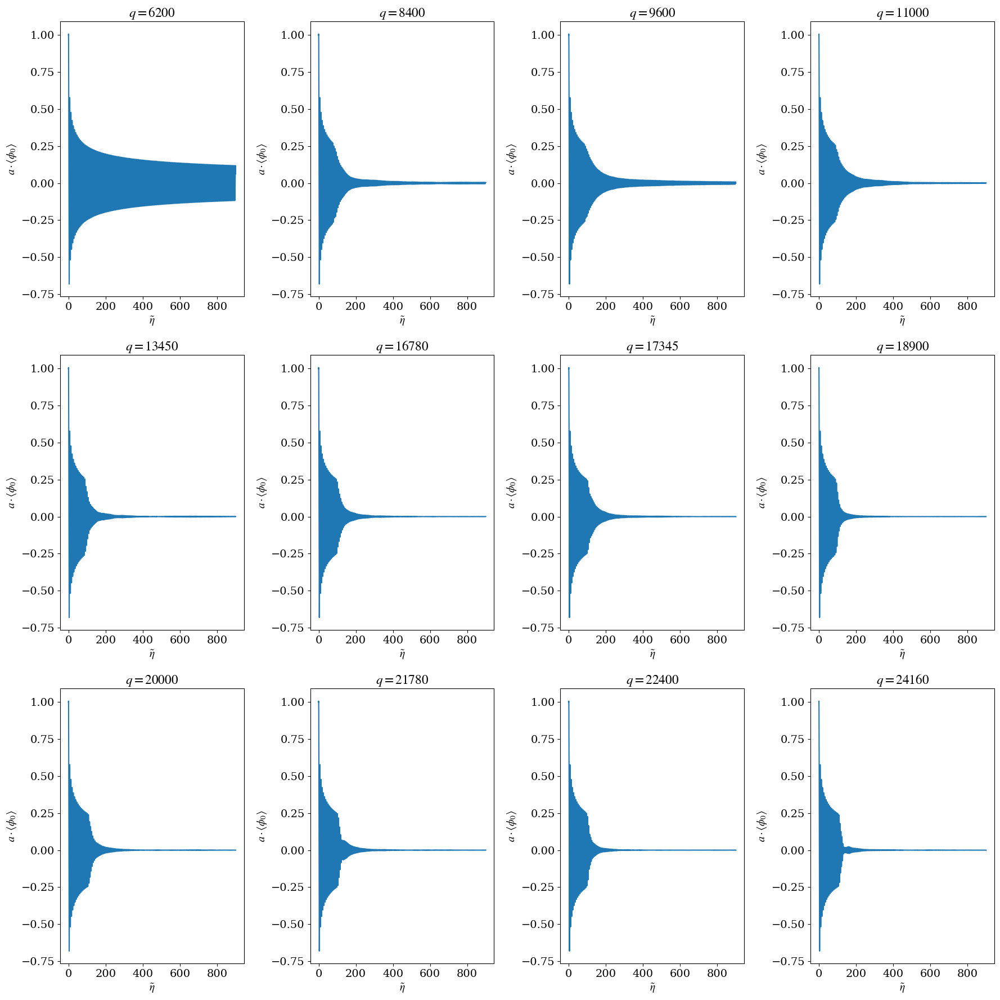

In [8]:
infDat_m2phi2_q6200 = np.loadtxt(dir_m2phi2_q6200 + "average_scalar_0.txt")
infDat_m2phi2_q8400 = np.loadtxt(dir_m2phi2_q8400 + "average_scalar_0.txt")
infDat_m2phi2_q9600 = np.loadtxt(dir_m2phi2_q9600 + "average_scalar_0.txt")
infDat_m2phi2_q11000 = np.loadtxt(dir_m2phi2_q11000 + "average_scalar_0.txt")
infDat_m2phi2_q13450 = np.loadtxt(dir_m2phi2_q13450 + "average_scalar_0.txt")
infDat_m2phi2_q16780 = np.loadtxt(dir_m2phi2_q16780 + "average_scalar_0.txt")
infDat_m2phi2_q17345 = np.loadtxt(dir_m2phi2_q17345 + "average_scalar_0.txt")
infDat_m2phi2_q18900 = np.loadtxt(dir_m2phi2_q18900 + "average_scalar_0.txt")
infDat_m2phi2_q20000 = np.loadtxt(dir_m2phi2_q20000 + "average_scalar_0.txt")
infDat_m2phi2_q21780 = np.loadtxt(dir_m2phi2_q21780 + "average_scalar_0.txt")
infDat_m2phi2_q22400 = np.loadtxt(dir_m2phi2_q22400 + "average_scalar_0.txt")
infDat_m2phi2_q24160 = np.loadtxt(dir_m2phi2_q24160 + "average_scalar_0.txt")

def plot_inflaton_case(infDat_m2phi2, aDat_m2phi2, q_labels):
    plt.figure(figsize=(18, 18))

    for idx in range(12):
        plt.subplot(3, 4, idx+1)
        plot_fld(infDat_m2phi2[idx], "0", aDat_m2phi2[idx])
        plt.title(q_labels[idx])

    plt.tight_layout()
    plt.show()

plot_inflaton_case([infDat_m2phi2_q6200, infDat_m2phi2_q8400, infDat_m2phi2_q9600, infDat_m2phi2_q11000, infDat_m2phi2_q13450, infDat_m2phi2_q16780, infDat_m2phi2_q17345, infDat_m2phi2_q18900, infDat_m2phi2_q20000, infDat_m2phi2_q21780, infDat_m2phi2_q22400, infDat_m2phi2_q24160], [aDat_m2phi2_q6200, aDat_m2phi2_q8400, aDat_m2phi2_q9600, aDat_m2phi2_q11000, aDat_m2phi2_q13450, aDat_m2phi2_q16780, aDat_m2phi2_q17345, aDat_m2phi2_q18900, aDat_m2phi2_q20000, aDat_m2phi2_q21780, aDat_m2phi2_q22400, aDat_m2phi2_q24160], q_labels)

## Field $1$ (daughter field)

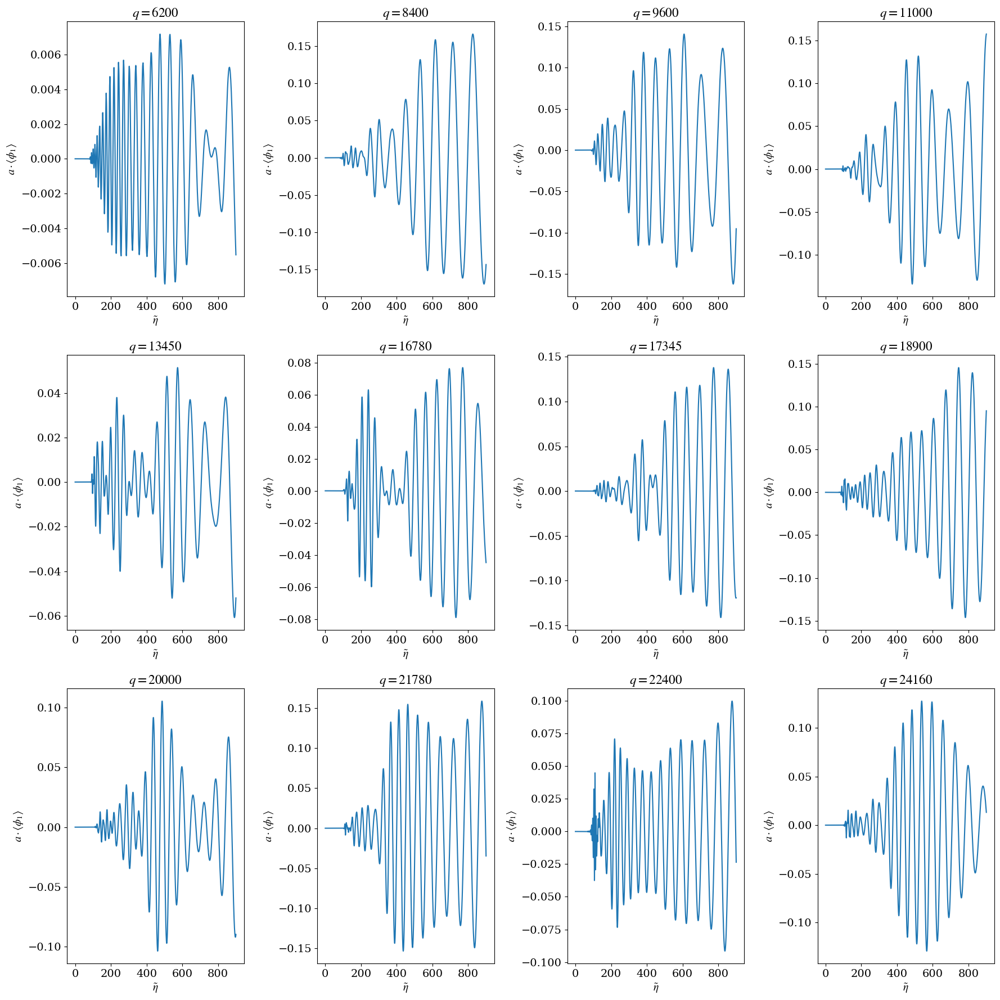

In [9]:
infDat_m2phi2_q6200 = np.loadtxt(dir_m2phi2_q6200 + "average_scalar_1.txt")
infDat_m2phi2_q8400 = np.loadtxt(dir_m2phi2_q8400 + "average_scalar_1.txt")
infDat_m2phi2_q9600 = np.loadtxt(dir_m2phi2_q9600 + "average_scalar_1.txt")
infDat_m2phi2_q11000 = np.loadtxt(dir_m2phi2_q11000 + "average_scalar_1.txt")
infDat_m2phi2_q13450 = np.loadtxt(dir_m2phi2_q13450 + "average_scalar_1.txt")
infDat_m2phi2_q16780 = np.loadtxt(dir_m2phi2_q16780 + "average_scalar_1.txt")
infDat_m2phi2_q17345 = np.loadtxt(dir_m2phi2_q17345 + "average_scalar_1.txt")
infDat_m2phi2_q18900 = np.loadtxt(dir_m2phi2_q18900 + "average_scalar_1.txt")
infDat_m2phi2_q20000 = np.loadtxt(dir_m2phi2_q20000 + "average_scalar_1.txt")
infDat_m2phi2_q21780 = np.loadtxt(dir_m2phi2_q21780 + "average_scalar_1.txt")
infDat_m2phi2_q22400 = np.loadtxt(dir_m2phi2_q22400 + "average_scalar_1.txt")
infDat_m2phi2_q24160 = np.loadtxt(dir_m2phi2_q24160 + "average_scalar_1.txt")

def plot_inflaton_case(infDat_m2phi2, aDat_m2phi2, q_labels):
    plt.figure(figsize=(18, 18))

    for idx in range(12):
        plt.subplot(3, 4, idx+1)
        plot_fld(infDat_m2phi2[idx], "1", aDat_m2phi2[idx])
        plt.title(q_labels[idx])

    plt.tight_layout()
    plt.show()

plot_inflaton_case([infDat_m2phi2_q6200, infDat_m2phi2_q8400, infDat_m2phi2_q9600, infDat_m2phi2_q11000, infDat_m2phi2_q13450, infDat_m2phi2_q16780, infDat_m2phi2_q17345, infDat_m2phi2_q18900, infDat_m2phi2_q20000, infDat_m2phi2_q21780, infDat_m2phi2_q22400, infDat_m2phi2_q24160], [aDat_m2phi2_q6200, aDat_m2phi2_q8400, aDat_m2phi2_q9600, aDat_m2phi2_q11000, aDat_m2phi2_q13450, aDat_m2phi2_q16780, aDat_m2phi2_q17345, aDat_m2phi2_q18900, aDat_m2phi2_q20000, aDat_m2phi2_q21780, aDat_m2phi2_q22400, aDat_m2phi2_q24160], q_labels)

# "Energy conservation" (the $1^{st}$ Friedmann's equation is satisfied)

The file  that checks the first Friedmann's equation contains

$\tilde\eta$ | $\frac{\langle LHS - RHS\rangle}{\langle LHS + RHS\rangle}$ | $\langle LHS \rangle$ | $\langle RHS \rangle$ 

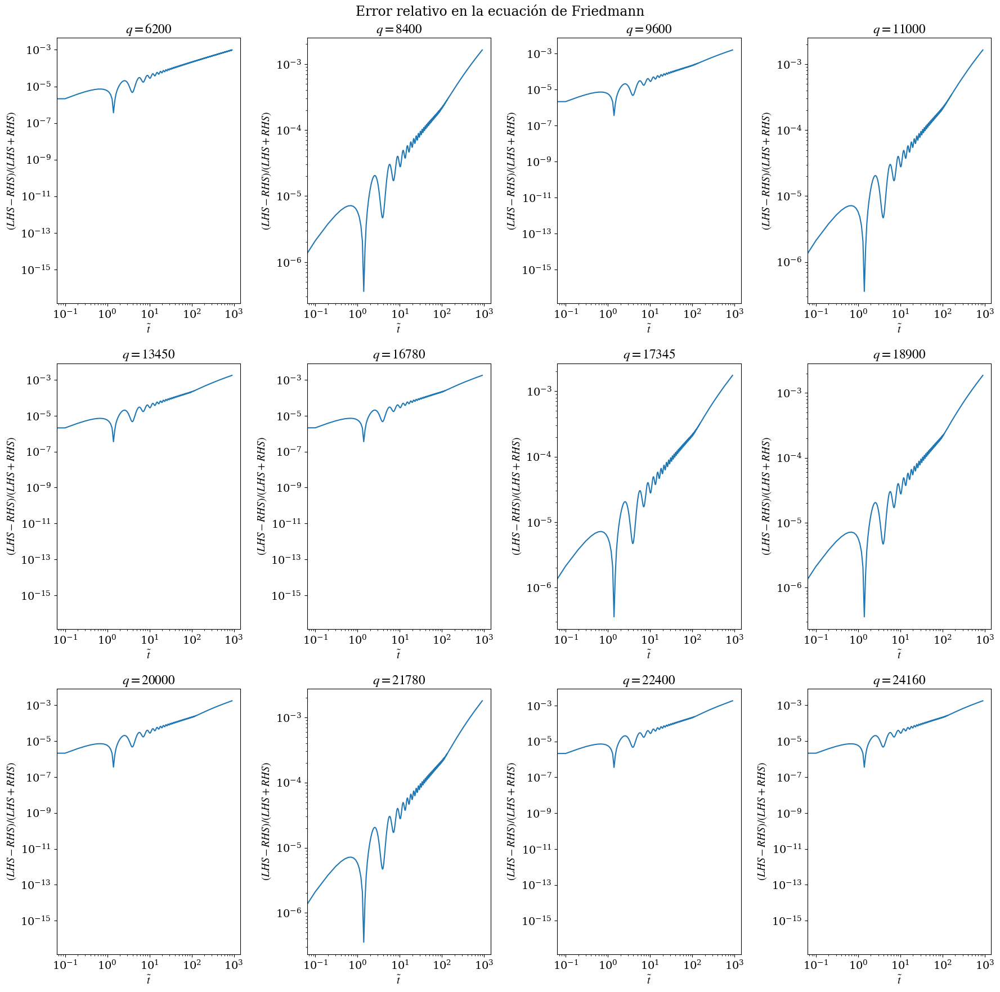

In [10]:
enConsDat_m2phi2_q6200 = np.loadtxt(dir_m2phi2_q6200 + "average_energy_conservation.txt")
enConsDat_m2phi2_q8400 = np.loadtxt(dir_m2phi2_q8400 + "average_energy_conservation.txt")
enConsDat_m2phi2_q9600 = np.loadtxt(dir_m2phi2_q9600 + "average_energy_conservation.txt")
enConsDat_m2phi2_q11000 = np.loadtxt(dir_m2phi2_q11000 + "average_energy_conservation.txt")
enConsDat_m2phi2_q13450 = np.loadtxt(dir_m2phi2_q13450 + "average_energy_conservation.txt")
enConsDat_m2phi2_q16780 = np.loadtxt(dir_m2phi2_q16780 + "average_energy_conservation.txt")
enConsDat_m2phi2_q17345 = np.loadtxt(dir_m2phi2_q17345 + "average_energy_conservation.txt")
enConsDat_m2phi2_q18900 = np.loadtxt(dir_m2phi2_q18900 + "average_energy_conservation.txt")
enConsDat_m2phi2_q20000 = np.loadtxt(dir_m2phi2_q20000 + "average_energy_conservation.txt")
enConsDat_m2phi2_q21780 = np.loadtxt(dir_m2phi2_q21780 + "average_energy_conservation.txt")
enConsDat_m2phi2_q22400 = np.loadtxt(dir_m2phi2_q22400 + "average_energy_conservation.txt")
enConsDat_m2phi2_q24160 = np.loadtxt(dir_m2phi2_q24160 + "average_energy_conservation.txt")

def plot_energy_conservation_case(enConsDat_m2phi2, q_labels):
    plt.figure(figsize=(18, 18))

    for idx in range(12):
        plt.subplot(3, 4, idx+1)
        plt.plot(enConsDat_m2phi2[idx][:,0], np.abs(enConsDat_m2phi2[idx][:,1]))
        plt.title(q_labels[idx])
        plt.yscale('log')
        plt.xscale('log')
        plt.xlabel(r'$\tilde t$')
        plt.ylabel(r'$(LHS - RHS)/(LHS + RHS)$')

    plt.suptitle(r"Error relativo en la ecuación de Friedmann")
    plt.tight_layout()
    plt.show()

plot_energy_conservation_case([enConsDat_m2phi2_q6200, enConsDat_m2phi2_q8400, enConsDat_m2phi2_q9600, enConsDat_m2phi2_q11000, enConsDat_m2phi2_q13450, enConsDat_m2phi2_q16780, enConsDat_m2phi2_q17345, enConsDat_m2phi2_q18900, enConsDat_m2phi2_q20000, enConsDat_m2phi2_q21780, enConsDat_m2phi2_q22400, enConsDat_m2phi2_q24160], q_labels)

# Energy densities

The file with the energy densities contains

$\tilde\eta$ | $\tilde E_K^{(0)}$ | $\tilde E_G^{(0)}$ |$\dots$| $\tilde E_K^{(N_s-1)}$ | $\tilde E_G^{(N_s-1)}$ |  $\tilde E_V^{(0)}$ | $\dots$ |  $\tilde E_V^{(N_p-1)}$ | $\langle \tilde \rho \rangle$

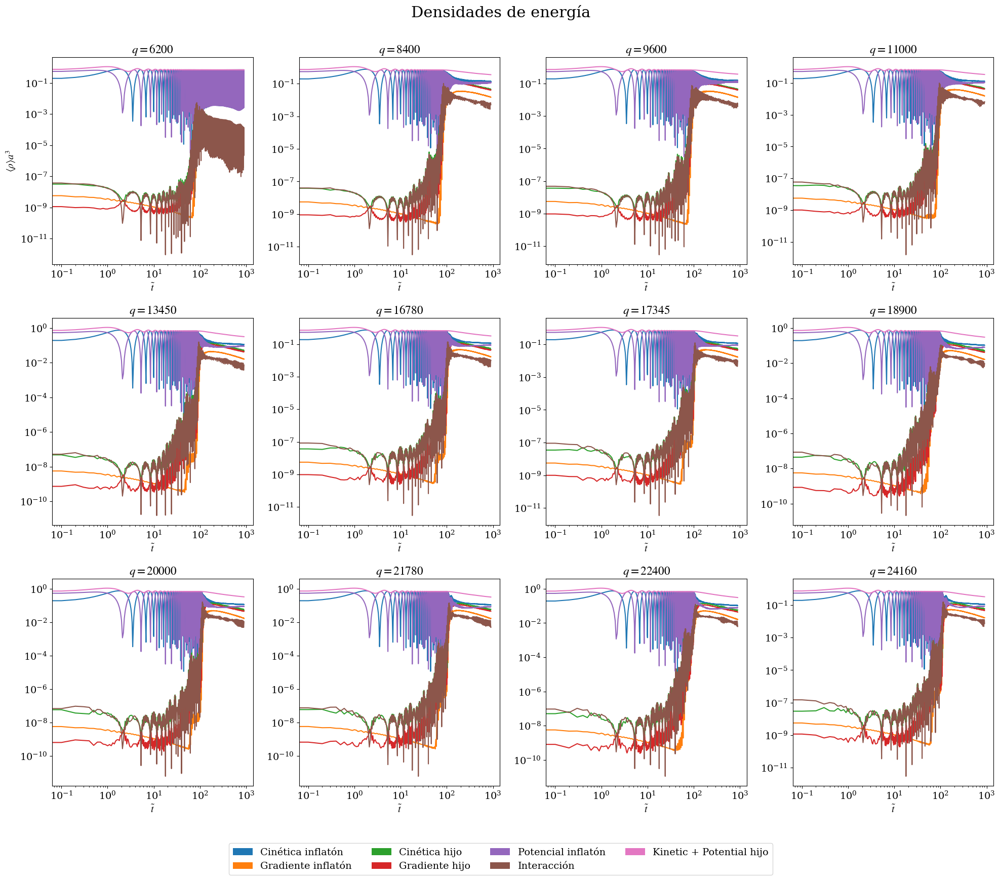

In [11]:
from matplotlib.patches import Patch

enDat_m2phi2_q6200 = np.loadtxt(dir_m2phi2_q6200 + "average_energies.txt")
enDat_m2phi2_q8400 = np.loadtxt(dir_m2phi2_q8400 + "average_energies.txt")
enDat_m2phi2_q9600 = np.loadtxt(dir_m2phi2_q9600 + "average_energies.txt")
enDat_m2phi2_q11000 = np.loadtxt(dir_m2phi2_q11000 + "average_energies.txt")
enDat_m2phi2_q13450 = np.loadtxt(dir_m2phi2_q13450 + "average_energies.txt")
enDat_m2phi2_q16780 = np.loadtxt(dir_m2phi2_q16780 + "average_energies.txt")
enDat_m2phi2_q17345 = np.loadtxt(dir_m2phi2_q17345 + "average_energies.txt")
enDat_m2phi2_q18900 = np.loadtxt(dir_m2phi2_q18900 + "average_energies.txt")
enDat_m2phi2_q20000 = np.loadtxt(dir_m2phi2_q20000 + "average_energies.txt")
enDat_m2phi2_q21780 = np.loadtxt(dir_m2phi2_q21780 + "average_energies.txt")
enDat_m2phi2_q22400 = np.loadtxt(dir_m2phi2_q22400 + "average_energies.txt")
enDat_m2phi2_q24160 = np.loadtxt(dir_m2phi2_q24160 + "average_energies.txt")

def plot_combined_models_case(enDat, aDat, q_val_labels):
    
    # Etiquetas de las componentes y colores
    labels = ["Cinética inflatón", "Gradiente inflatón", "Cinética hijo", "Gradiente hijo", 
              "Potencial inflatón", "Interacción", "Kinetic + Potential hijo"]
    colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple", "tab:brown", "tab:pink"]
    
    fig = plt.figure(figsize=(20, 18))
    
    for idx in range(12):
        row, col = divmod(idx, 4)
        ax = plt.subplot2grid((3, 4), (row, col))
        enDat_i = enDat[idx]
        aDat_i = aDat[idx]
        for comp in range(1, enDat_i.shape[1]):
            ax.plot(enDat_i[:,0], enDat_i[:,comp] * aDat_i[:,1]**3, color=colors[comp-1])
        ax.set_yscale('log')
        ax.set_xscale('log')
        ax.set_title(fr"{q_val_labels[idx]}")
        ax.set_xlabel(r"$\tilde{t}$")
        if idx == 0: ax.set_ylabel(r"$\langle \rho \rangle a^3$")

    plt.tight_layout(rect=[0, 0.08, 1, 0.95])

    # Leyenda general
    legend_elements = [Patch(facecolor=colors[i], label=labels[i]) for i in range(len(labels))]
    fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, 0.02), ncol=4, fontsize=14)

    plt.suptitle(fr"Densidades de energía", fontsize=22)
    plt.show()

plot_combined_models_case([enDat_m2phi2_q6200, enDat_m2phi2_q8400, enDat_m2phi2_q9600, enDat_m2phi2_q11000, enDat_m2phi2_q13450, enDat_m2phi2_q16780, enDat_m2phi2_q17345, enDat_m2phi2_q18900, enDat_m2phi2_q20000, enDat_m2phi2_q21780, enDat_m2phi2_q22400, enDat_m2phi2_q24160], [aDat_m2phi2_q6200, aDat_m2phi2_q8400, aDat_m2phi2_q9600, aDat_m2phi2_q11000, aDat_m2phi2_q13450, aDat_m2phi2_q16780, aDat_m2phi2_q17345, aDat_m2phi2_q18900, aDat_m2phi2_q20000, aDat_m2phi2_q21780, aDat_m2phi2_q22400, aDat_m2phi2_q24160], q_labels)

# Spectra

Spectra output varies depending on the option. The default one generates a txt file with the following columns:

$\tilde k$ | $\tilde\Delta_{\tilde\phi}$ | $\tilde\Delta_{\tilde\phi'}$ | $\tilde n_{\tilde\phi}$ | bin multiplicity

In [12]:
def load_spectrum(filename, comment='#'):
    """Función para cargar los espectros manejando los saltos de línea de CosmoLattice."""
    with open(filename, 'r') as file:
        nBins = 0
        line = file.readline()
        while line and line != "\n":
            if line[0] != comment:
                nBins += 1
            line = file.readline()
    
    fileSp = np.loadtxt(filename, comments=comment)
    nSpectra = len(fileSp) // nBins
    return fileSp, int(nBins), int(nSpectra)

def plot_spectrum_into_ax(ax, spectra, column, nBins, nSpectra, ylabel, colormap='plasma'):
    """Dibuja el espectro en un eje específico con una barra de color."""
    colors = plt.get_cmap(colormap)
    # Ajustamos el normalizador para que coincida con el tiempo de la simulación si es necesario
    norm = plt.Normalize(vmin=0, vmax=nSpectra-1)
    
    for i in range(nSpectra):
        ax.plot(
            spectra[i*nBins:(i+1)*nBins, 0],
            spectra[i*nBins:(i+1)*nBins, column],
            color=colors(i / nSpectra),
            alpha=0.8
        )
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.grid(True, which='both', ls='--', alpha=0.5)
    ax.set_xlabel(r'$\tilde{k}$', fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    
    # Barra de color individual para cada subplot
    sm = plt.cm.ScalarMappable(cmap=colors, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.02)
    cbar.set_label(r'$t$', fontsize=12)

def plot_combined_spectra(field_num, dirs, q_val_labels, column=1):
    """
    field_num: 0 para inflatón, 1 para campo hijo.
    column: 1 para Espectro (Delta), 2 para Número de ocupación (nk).
    """
    field_name = "inflatón" if field_num == 0 else "hijo"
    quantity = "Espectro" if column == 1 else "Número de ocupación"
    ylabel = (r'$\tilde{\Delta}_{\tilde{\phi}}$' if field_num == 0 else r'$\tilde{\Delta}_{\tilde{\chi}}$') if column == 1 else (r'$\tilde{n}_{\tilde{\phi}}$' if field_num == 0 else r'$\tilde{n}_{\tilde{\chi}}$')
    
    filename = f"spectra_scalar_{field_num}.txt"
    fig = plt.figure(figsize=(20, 18))
    
    for idx in range(12):
        row, col = divmod(idx, 4)
        ax = plt.subplot2grid((3, 4), (row, col))
        path = os.path.join(dirs[idx], filename)
        if os.path.exists(path):
            sp, nBins, nSpec = load_spectrum(path)
            plot_spectrum_into_ax(ax, sp, column, nBins, nSpec, ylabel)
        ax.set_title(fr"{q_val_labels[idx]}")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle(fr"{quantity} del campo {field_name}", fontsize=22)
    plt.show()

## Inflaton

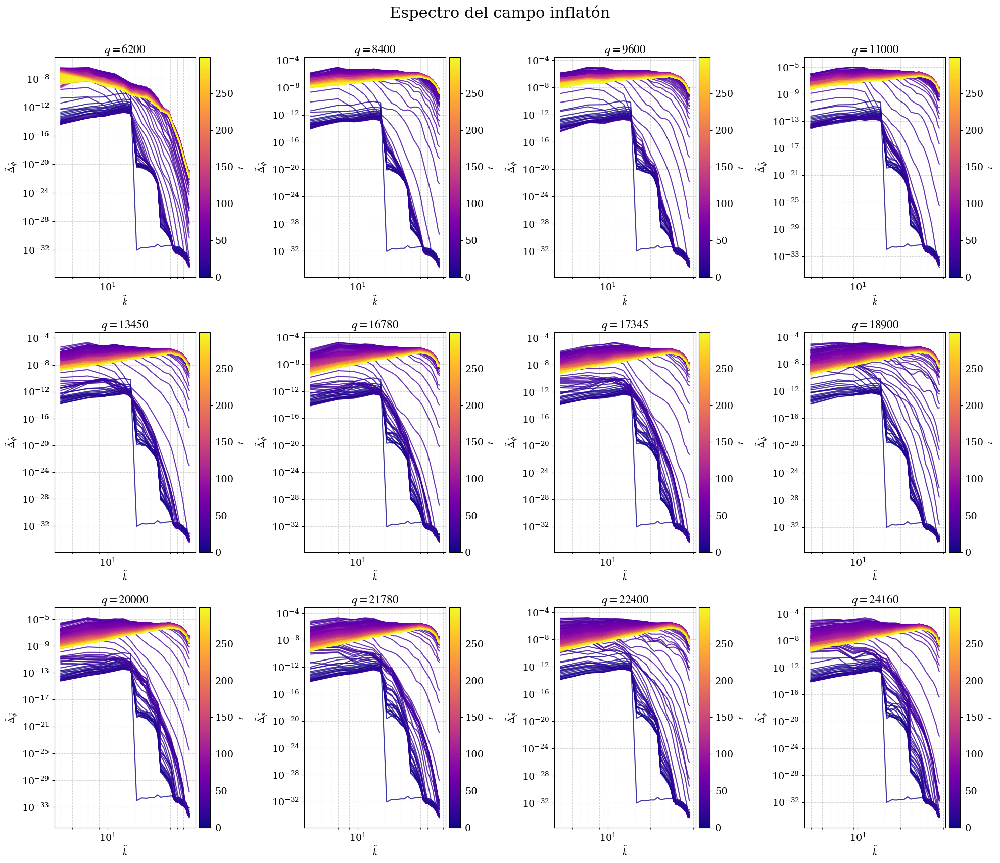

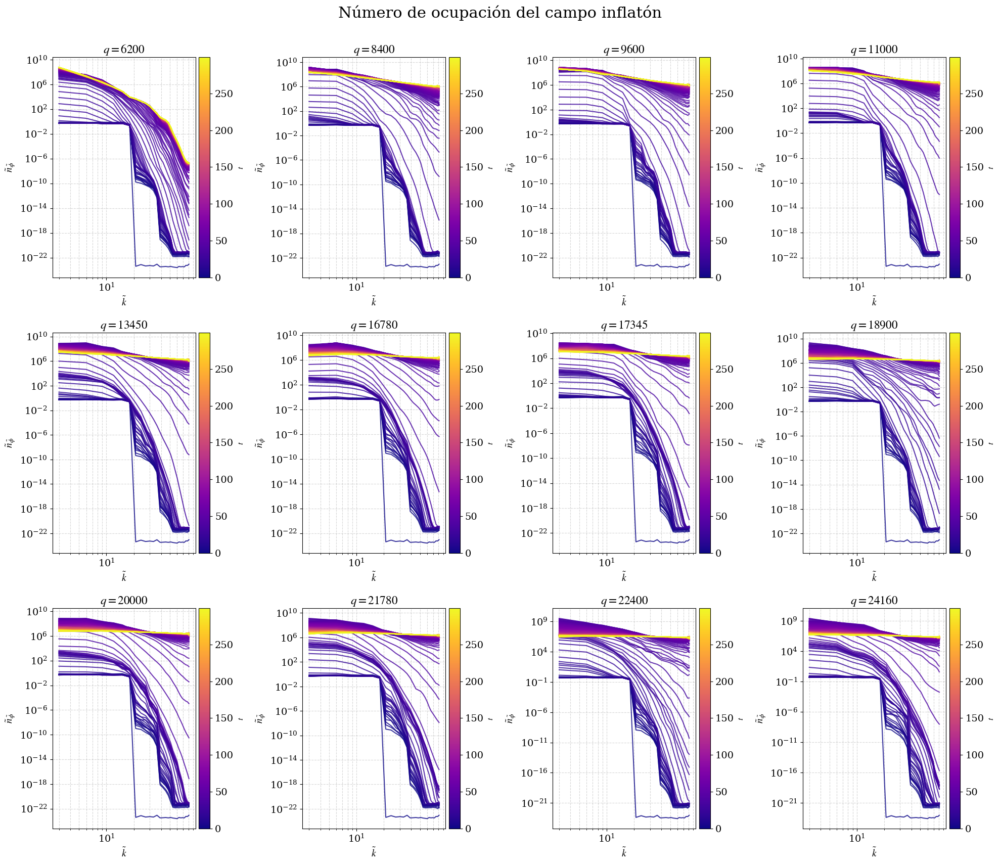

In [13]:
plot_combined_spectra(0,[dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], q_labels, column=1)

plot_combined_spectra(0,[dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], q_labels, column=3)

## Daughter field

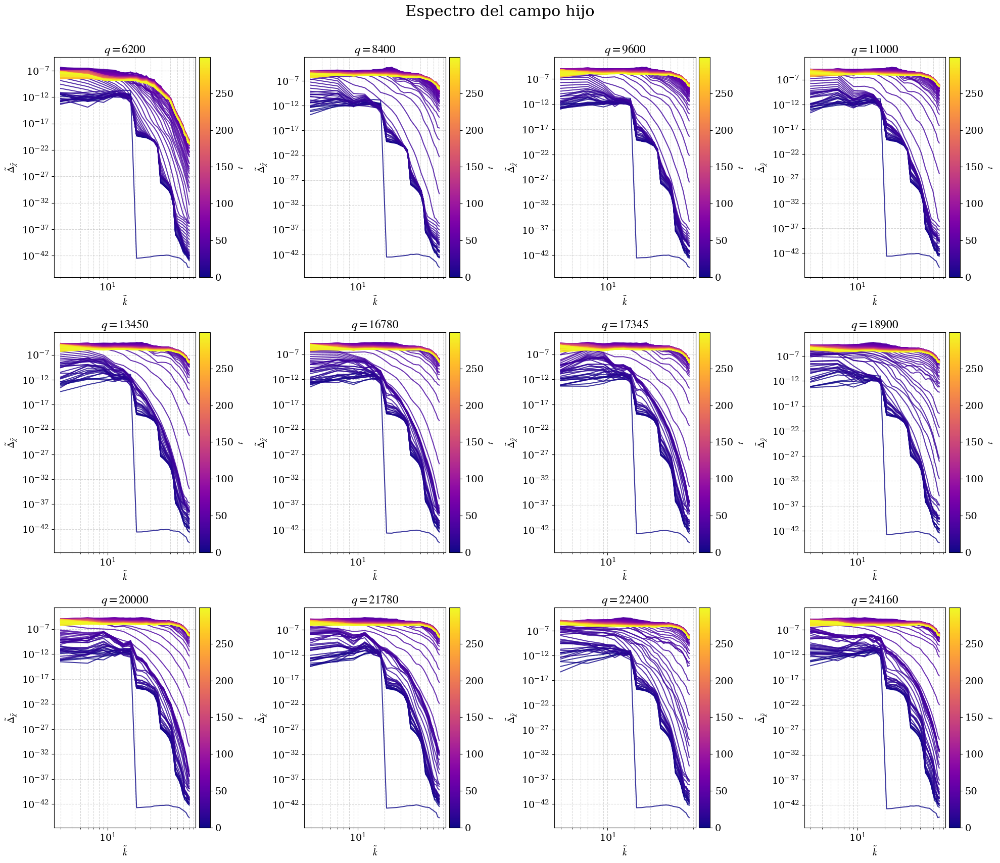

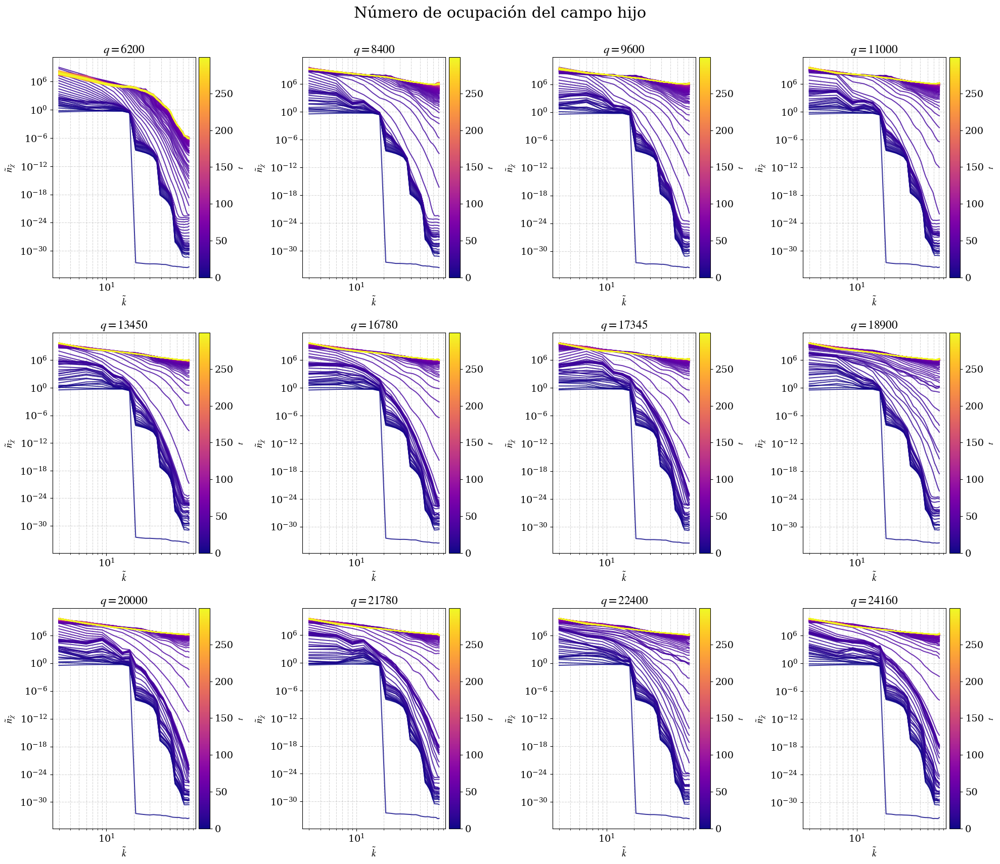

In [14]:
plot_combined_spectra(1,[dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], q_labels, column=1)

plot_combined_spectra(1,[dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], q_labels, column=3)

# GWs

In [15]:
def load_gws(filename, comment='#'):
    """Carga los espectros de GWs manejando los saltos de línea."""
    with open(filename, 'r') as file:
        nBins = 0
        line = file.readline()
        while line and line != "\n":
            if line[0] != comment:
                nBins += 1
            line = file.readline()
    
    fileSp = np.loadtxt(filename, comments=comment)
    nSpectra = len(fileSp) // nBins
    return fileSp, int(nBins), int(nSpectra)

def plot_gw_into_ax(ax, gw_data, nBins, nSpectra, ylabel=r'$\tilde{\Delta}_h$', colormap='viridis'):
    """Dibuja el espectro de GWs en un eje específico."""
    colors = plt.get_cmap(colormap)
    norm = plt.Normalize(vmin=0, vmax=nSpectra-1)
    
    for i in range(nSpectra):
        ax.plot(
            gw_data[i*nBins:(i+1)*nBins, 0],
            gw_data[i*nBins:(i+1)*nBins, 1], # La columna 1 suele ser el espectro de potencia
            color=colors(i / nSpectra),
            alpha=0.8
        )
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.grid(True, which='both', ls='--', alpha=0.5)
    ax.set_xlabel(r'$\tilde{k}$', fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    
    sm = plt.cm.ScalarMappable(cmap=colors, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.02)
    cbar.set_label(r'$t$', fontsize=12)

def plot_combined_gws_case(dirs, q_val_labels):
    
    filename = "spectra_gws.txt"
    fig = plt.figure(figsize=(20, 18))
    ylabel = r'$\tilde{\Delta}_h$'
    
    for i in range(12):
        row, col = divmod(i, 4)
        ax = plt.subplot2grid((3, 4), (row, col))
        path = os.path.join(dirs[i], filename)
        if os.path.exists(path):
            sp, nBins, nSpec = load_gws(path)
            plot_gw_into_ax(ax, sp, nBins, nSpec, ylabel, colormap='plasma')
        ax.set_title(fr"{q_val_labels[i]}")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle(fr"Espectro de Ondas Gravitacionales", fontsize=22)
    plt.show()

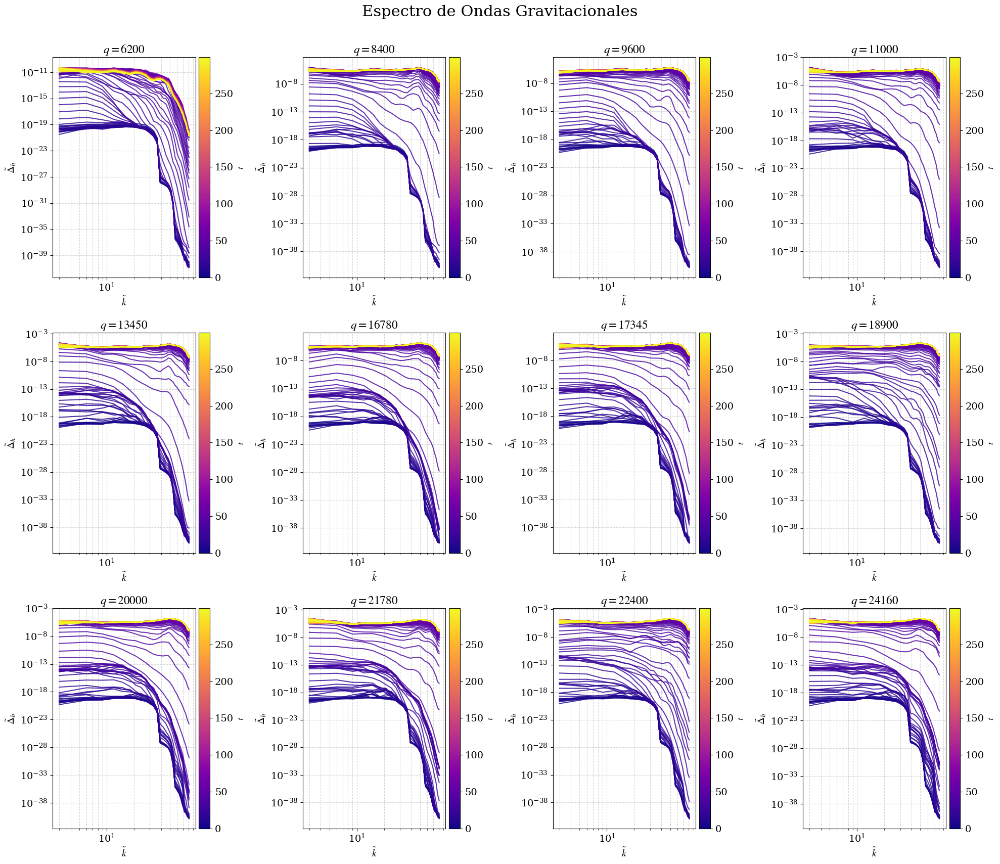

In [16]:
plot_combined_gws_case([dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], q_labels)

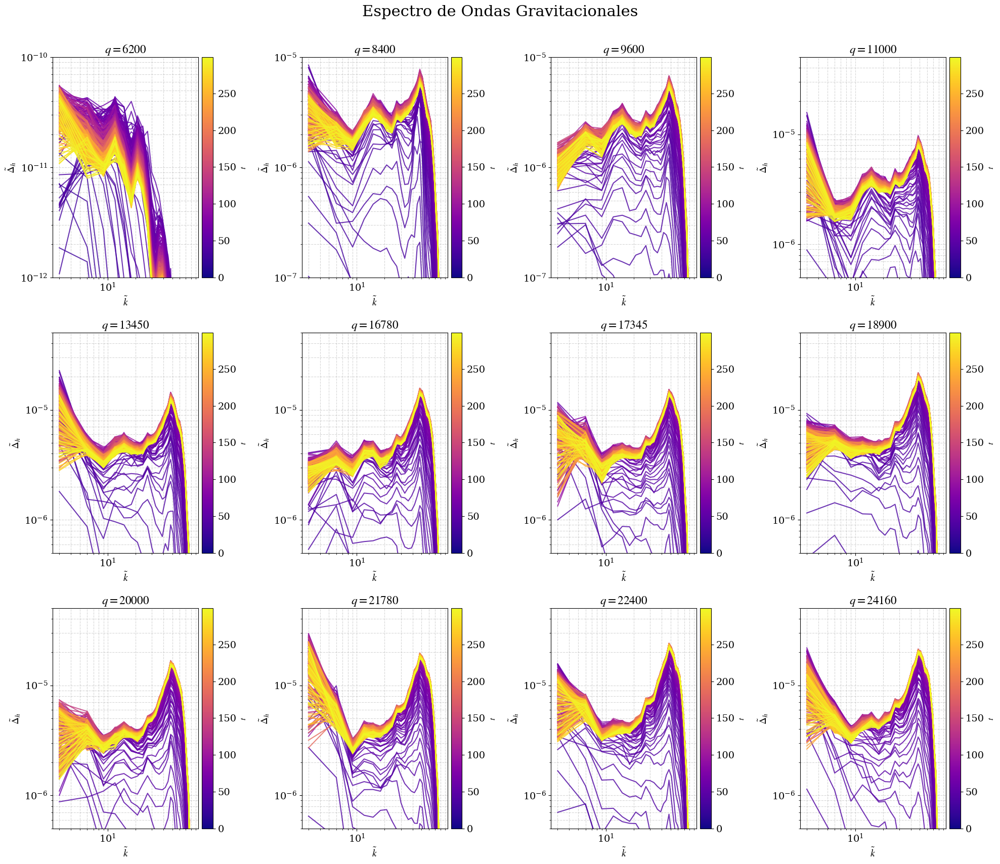

In [17]:
def plot_gw_into_ax(ax, gw_data, nBins, nSpectra, ylabel=r'$\tilde{\Delta}_h$', colormap='viridis', auto_zoom=True):
    """Dibuja el espectro de GWs en un eje específico con zoom dinámico inteligente."""
    colors = plt.get_cmap(colormap)
    norm = plt.Normalize(vmin=0, vmax=nSpectra-1)
    
    # 1. Graficar las curvas
    for i in range(nSpectra):
        ax.plot(
            gw_data[i*nBins:(i+1)*nBins, 0],
            gw_data[i*nBins:(i+1)*nBins, 1], 
            color=colors(i / nSpectra),
            alpha=0.8
        )
    
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.grid(True, which='both', ls='--', alpha=0.5)
    ax.set_xlabel(r'$\tilde{k}$', fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    
    # --- LÓGICA DE ZOOM DINÁMICO ---
    if auto_zoom:
        # Extraemos la columna de amplitudes (columna 1) y filtramos valores > 0
        y_vals = gw_data[:, 1]
        pos_vals = y_vals[y_vals > 0]
        
        if len(pos_vals) > 0:
            max_val = np.nanmax(pos_vals)
            
            # Obtenemos el exponente base (orden de magnitud)
            expo = np.floor(np.log10(max_val))
            orden = 10**expo
            
            # REGLA DE TECHO FLEXIBLE:
            # Si el valor máximo real es mayor a 5 * orden, ponemos el límite en 10.
            # Esto evita que los picos queden fuera del gráfico.
            if max_val > 5 * orden:
                y_top = 10 * orden
            else:
                y_top = 5 * orden
            
            # El límite inferior son 2 órdenes de magnitud menos que el superior
            y_bottom = y_top / 100
            
            # Aplicar límites al objeto ax
            ax.set_ylim(y_bottom, y_top)
    # -------------------------------
    
    sm = plt.cm.ScalarMappable(cmap=colors, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.02)
    cbar.set_label(r'$t$', fontsize=12)

plot_combined_gws_case([dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], q_labels)

## Energía de las GWs

In [18]:
def integrate_gw_spectrum(gw_data, nBins, nSpectra):
    """
    Integra el espectro de GWs para cada tiempo de salida.
    Utiliza la regla del trapecio sobre los datos del espectro.
    """
    total_energy = []
    for i in range(nSpectra):
        # Seleccionamos el bloque del espectro para el tiempo i
        # Columna 0: k_tilde, Columna 1: Delta_h
        k = gw_data[i*nBins:(i+1)*nBins, 0]
        delta_h = gw_data[i*nBins:(i+1)*nBins, 1]
        
        # Integración numérica
        energy = np.trapezoid(delta_h, k)
        total_energy.append(energy)
    return np.array(total_energy)

def plot_combined_gw_energies(dirs, q_val_labels):
    """
    Gráfica la evolución temporal de la energía total de las GWs.
    """
    filename = "spectra_gws.txt"
    fig = plt.figure(figsize=(20, 18))
    
    for i in range(12):
        row, col = divmod(i, 4)
        ax = plt.subplot2grid((3, 4), (row, col))
        path = os.path.join(dirs[i], filename)
        if os.path.exists(path):
            sp, nBins, nSpec = load_gws(path) # Usamos la función load_gws definida antes
            e_gw = integrate_gw_spectrum(sp, nBins, nSpec)
            # El eje x es el índice del espectro (o tiempo proporcional)
            ax.plot(np.arange(nSpec), e_gw, color='tab:red', lw=2)
        ax.set_yscale('log')
        ax.set_xscale('log')
        ax.set_title(fr"{q_val_labels[i]}")
        ax.set_xlabel(r"Índice de espectro ($t$)")
        if i == 0: ax.set_ylabel(r"$E_{GW}$ (Integrada)")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle(fr"Evolución de la Energía de GWs", fontsize=22)
    plt.show()

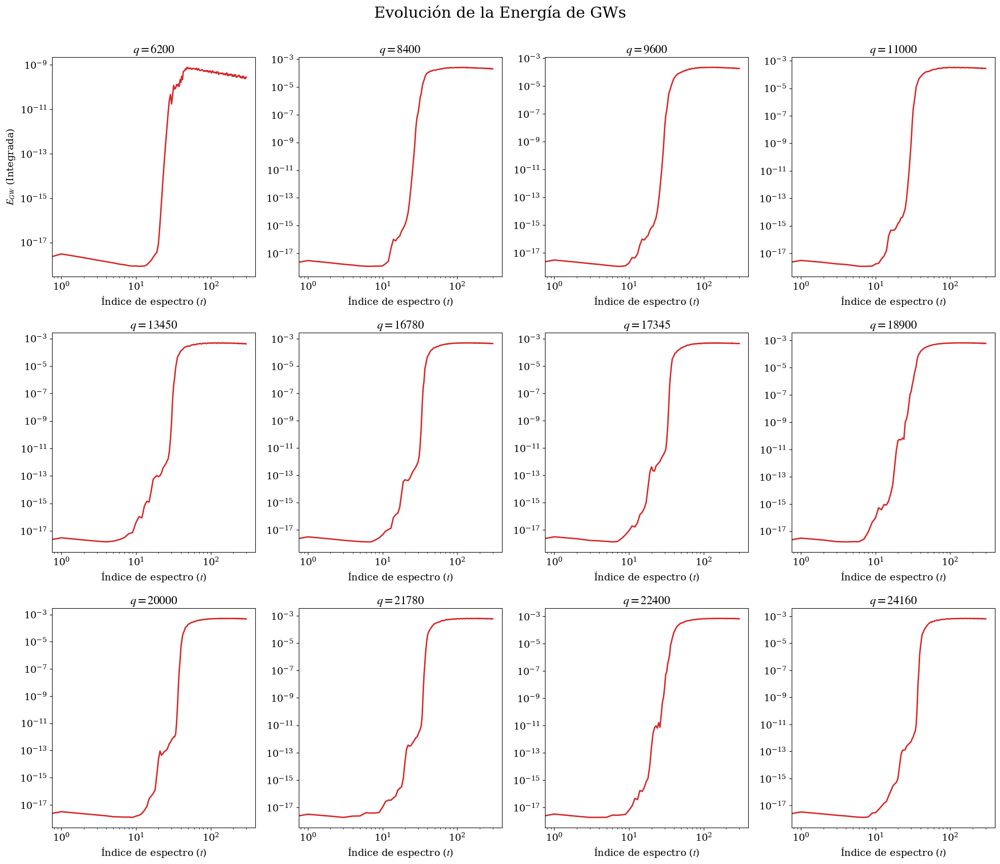

In [19]:
plot_combined_gw_energies([dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], q_labels)

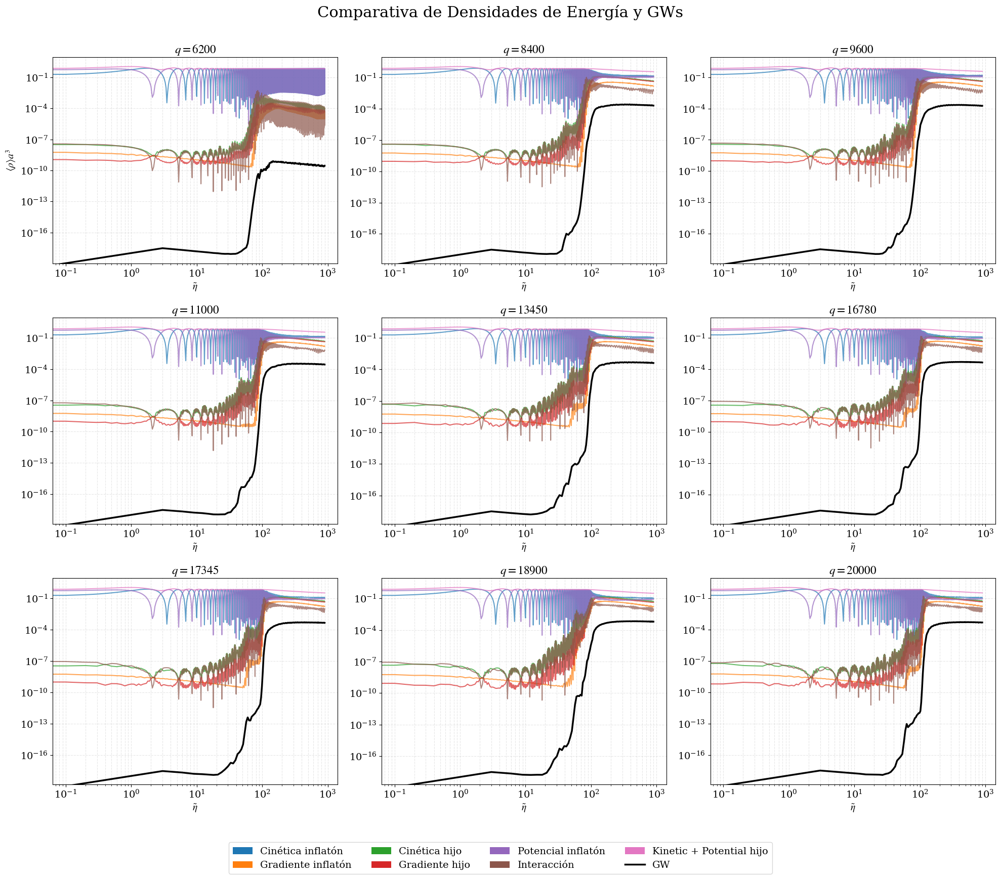

In [20]:
def plot_combined_total_energies(dir, aDat, m_val_labels):
    
    labels = ["Cinética inflatón", "Gradiente inflatón", "Cinética hijo", "Gradiente hijo", 
              "Potencial inflatón", "Interacción", "Kinetic + Potential hijo", "GW"]
    colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple", "tab:brown", "tab:pink", "black"]
    
    fig = plt.figure(figsize=(20, 18))
    
    def plot_densities_and_gw(ax, dir_path, aDat, title):
        # 1. Cargar y graficar densidades de los campos
        en_path = os.path.join(dir_path, "average_energies.txt")
        if os.path.exists(en_path):
            enDat = np.loadtxt(en_path)
            nCols = enDat.shape[1]
            for col in range(1, nCols):
                ax.plot(enDat[:,0], enDat[:,col] * aDat[:,1]**3, color=colors[col-1], alpha=0.7)
        
        # 2. Cargar, integrar y graficar GWs
        gw_path = os.path.join(dir_path, "spectra_gws.txt")
        if os.path.exists(gw_path):
            # Usamos las funciones de carga y integración definidas previamente
            sp, nBins, nSpec = load_gws(gw_path)
            e_gw = integrate_gw_spectrum(sp, nBins, nSpec)
            # El factor '3' suele ser el intervalo de tiempo entre salidas de espectros
            ax.plot(np.arange(nSpec)*3, e_gw, color='black', lw=2.5, label='GW')
        
        ax.set_yscale('log')
        ax.set_xscale('log')
        ax.set_title(title)
        ax.set_xlabel(r"$\tilde{\eta}$")
        ax.grid(True, which='both', ls='--', alpha=0.3)

    for i in range(9):
        row, col = divmod(i, 3)
        ax = plt.subplot2grid((3, 3), (row, col))
        plot_densities_and_gw(ax, dir[i], aDat[i], fr"{m_val_labels[i]}")
        if i == 0: ax.set_ylabel(r"$\langle \rho \rangle a^3$")

    plt.tight_layout(rect=[0, 0.08, 1, 0.95])

    # Leyenda única con el agregado de GW
    legend_elements = [Patch(facecolor=colors[i], label=labels[i]) for i in range(len(labels)-1)]
    legend_elements.append(plt.Line2D([0], [0], color='black', lw=2.5, label='GW'))
    
    fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, 0.02), ncol=4, fontsize=14)
    plt.suptitle(fr"Comparativa de Densidades de Energía y GWs", fontsize=22)
    plt.show()

plot_combined_total_energies([dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], [aDat_m2phi2_q6200, aDat_m2phi2_q8400, aDat_m2phi2_q9600, aDat_m2phi2_q11000, aDat_m2phi2_q13450, aDat_m2phi2_q16780, aDat_m2phi2_q17345, aDat_m2phi2_q18900, aDat_m2phi2_q20000, aDat_m2phi2_q21780, aDat_m2phi2_q22400, aDat_m2phi2_q24160], q_labels)

# Escaleo de los espectros a tiempo hoy

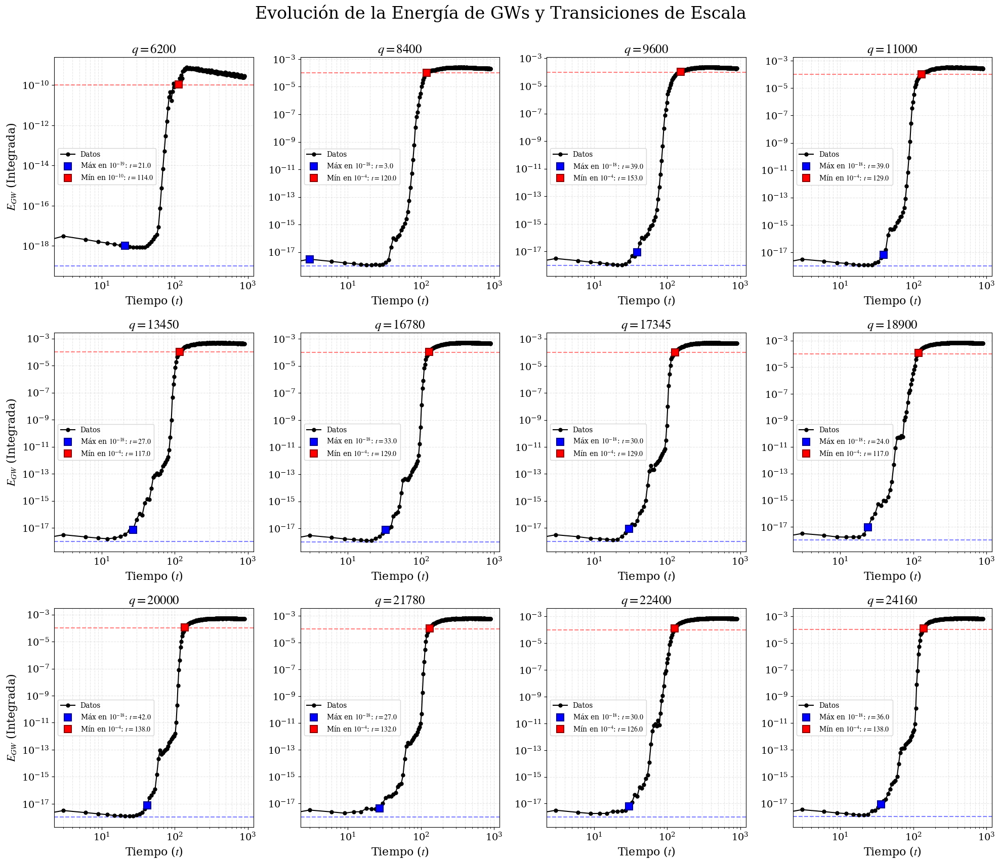

In [21]:
# =====================================================================
# 1. FUNCIONES DE LECTURA E INTEGRACIÓN
# =====================================================================
def load_gws(filename, comment='#'):
    file = open(filename)
    nBins = 0
    line = file.readline()
    while line != "\n":
        if line and line[0] != comment:
            nBins += 1
        line = file.readline()
    file.close()

    fileSp = np.loadtxt(filename, comments=comment)
    nSpectra = len(fileSp) // nBins
    return fileSp, int(nBins), int(nSpectra)

def integrate_gw_spectrum(gw_data, nBins, nSpectra):
    """
    Integra el espectro de GWs para cada tiempo de salida
    usando la regla del trapecio.
    """
    total_energy = []
    for i in range(nSpectra):
        k = gw_data[i*nBins:(i+1)*nBins, 0]
        delta_h = gw_data[i*nBins:(i+1)*nBins, 1]
        energy = np.trapezoid(delta_h, k)
        total_energy.append(energy)
    return np.array(total_energy)

# =====================================================================
# 2. FUNCIONES DE ANÁLISIS DE ESCALA
# =====================================================================
def analyze_scale_transitions(t_data, E_data):
    """Identifica transiciones entre órdenes de magnitud."""
    E_data = np.asarray(E_data, dtype=float)
    t_data = np.asarray(t_data, dtype=float)
    
    valid_mask = (E_data > 0) & np.isfinite(E_data) & np.isfinite(t_data)
    valid_indices = np.where(valid_mask)[0]
    
    if len(valid_indices) == 0:
        return None
    
    E_valid = E_data[valid_indices]
    t_valid = t_data[valid_indices]
    
    magnitudes = np.floor(np.log10(E_valid))
    min_magnitude = int(magnitudes.min())
    max_magnitude = int(magnitudes.max())
    
    idx_min_mag_group = np.where(magnitudes == min_magnitude)[0]
    idx_max_mag_group = np.where(magnitudes == max_magnitude)[0]
    
    local_max_in_min = np.argmax(E_valid[idx_min_mag_group])
    idx_max_in_min = valid_indices[idx_min_mag_group[local_max_in_min]]
    
    local_min_in_max = np.argmin(E_valid[idx_max_mag_group])
    idx_min_in_max = valid_indices[idx_max_mag_group[local_min_in_max]]
    
    return {
        'min_magnitude': min_magnitude,
        'max_magnitude': max_magnitude,
        'idx_max_in_min': idx_max_in_min,
        't_max_in_min': t_data[idx_max_in_min],
        'E_max_in_min': E_data[idx_max_in_min],
        'idx_min_in_max': idx_min_in_max,
        't_min_in_max': t_data[idx_min_in_max],
        'E_min_in_max': E_data[idx_min_in_max],
        'n_valid': len(valid_indices),
        'n_total': len(E_data),
    }

def print_scale_analysis(analysis):
    """Imprime el reporte en la consola de forma estructurada."""
    print(f"Valores procesados: {analysis['n_valid']}/{analysis['n_total']}")
    print(f"Rango de órdenes de magnitud: 10^{analysis['min_magnitude']} a 10^{analysis['max_magnitude']}")
    
    print(f"1. MÁX CON MENOR ORDEN (10^{analysis['min_magnitude']}):")
    print(f"   t = {analysis['t_max_in_min']:.2f} | E = {analysis['E_max_in_min']:.6e}")
    
    print(f"2. MÍN CON MAYOR ORDEN (10^{analysis['max_magnitude']}):")
    print(f"   t = {analysis['t_min_in_max']:.2f} | E = {analysis['E_min_in_max']:.6e}")
    print(f"Ratio de energías: {analysis['E_min_in_max'] / analysis['E_max_in_min']:.2e}\n")

def plot_scale_transitions(t_data, E_data, analysis, ax):
    """Genera el gráfico inyectándolo en el eje (ax) provisto."""
    ax.plot(t_data, E_data, 'o-', markersize=5, label='Datos', color='black', linewidth=1.5, zorder=3)

    idx1, t1, E1, mag_min = analysis['idx_max_in_min'], analysis['t_max_in_min'], analysis['E_max_in_min'], analysis['min_magnitude']
    idx2, t2, E2, mag_max = analysis['idx_min_in_max'], analysis['t_min_in_max'], analysis['E_min_in_max'], analysis['max_magnitude']

    # Marcadores
    ax.plot(t1, E1, 's', markersize=10, 
             label=fr"Máx en $10^{{{mag_min}}}$: $t={t1:.1f}$", 
             color='blue', zorder=4, markeredgecolor='darkblue', markeredgewidth=1.5)

    ax.plot(t2, E2, 's', markersize=10, 
             label=fr"Mín en $10^{{{mag_max}}}$: $t={t2:.1f}$", 
             color='red', zorder=4, markeredgecolor='darkred', markeredgewidth=1.5)

    # Líneas horizontales
    ax.axhline(10**mag_min, color='blue', linestyle='--', lw=1.5, alpha=0.5)
    ax.axhline(10**mag_max, color='red', linestyle='--', lw=1.5, alpha=0.5)

    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend(fontsize=10, loc='best')
    ax.grid(True, which="both", ls="--", alpha=0.3)

# =====================================================================
# 3. FUNCIÓN PRINCIPAL DE PLOTEO (GRILLA 3x4)
# =====================================================================
def plot_combined_gw_energies(dirs, q_val_labels, verbose=False):
    """
    Gráfica la evolución temporal de la energía total de las GWs 
    aplicando el análisis de transiciones de escala en una grilla 3x4.
    """
    filename = "spectra_gws.txt"
    fig = plt.figure(figsize=(20, 18))
    
    for i in range(12):
        row, col = divmod(i, 4)
        ax = plt.subplot2grid((3, 4), (row, col))
        path = os.path.join(dirs[i], filename)
        
        if os.path.exists(path):
            sp, nBins, nSpec = load_gws(path)
            e_gw = integrate_gw_spectrum(sp, nBins, nSpec)
            
            # Vector de tiempo (ajusta el * 3 si el paso temporal de estas sim es distinto)
            t_gw = np.arange(nSpec) * 3 
            
            # Análisis y graficado
            analysis = analyze_scale_transitions(t_gw, e_gw)
            
            if analysis is not None:
                plot_scale_transitions(t_gw, e_gw, analysis, ax=ax)
                if verbose:
                    print(f"--- ANÁLISIS PARA: {q_val_labels[i]} ---")
                    print_scale_analysis(analysis)
            else:
                # Fallback estándar
                ax.plot(t_gw, e_gw, color='tab:red', lw=2)
                ax.set_yscale('log')
                ax.set_xscale('log')
                ax.grid(True, which="both", ls="--", alpha=0.3)
        else:
            # Si no existe el archivo, dejar el panel vacío con un aviso
            ax.text(0.5, 0.5, 'Datos no encontrados', ha='center', va='center', transform=ax.transAxes)
        
        # Estilos de los subplots
        ax.set_title(fr"{q_val_labels[i]}", fontsize=18)
        ax.set_xlabel(r"Tiempo ($t$)", fontsize=16)
        if col == 0: 
            ax.set_ylabel(r"$E_{GW}$ (Integrada)", fontsize=16)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle(fr"Evolución de la Energía de GWs y Transiciones de Escala", fontsize=24)
    plt.show()

# =====================================================================
# 4. EJECUCIÓN
# =====================================================================
plot_combined_gw_energies([dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], q_labels)

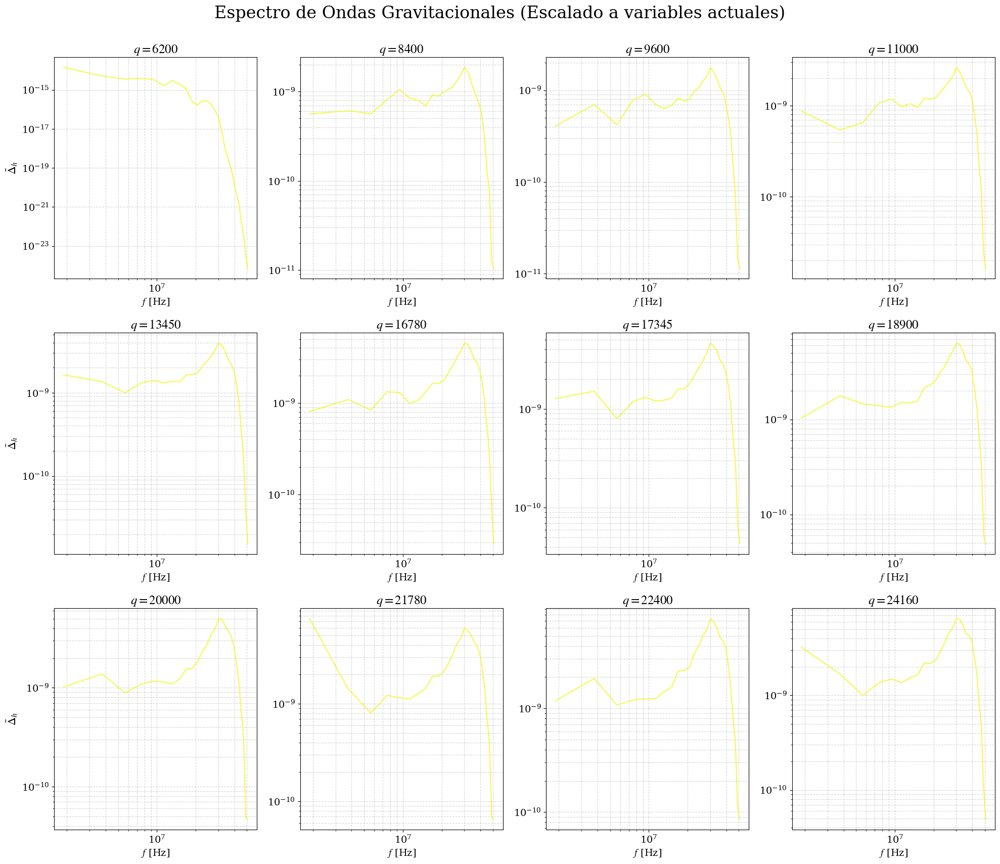

In [23]:
# =====================================================================
# 1. FUNCIÓN DE LECTURA DE DATOS
# =====================================================================
def load_gws(filename, comment='#'):
    """Carga los espectros de GWs manejando los saltos de línea."""
    with open(filename, 'r') as file:
        nBins = 0
        line = file.readline()
        while line and line != "\n":
            if line[0] != comment:
                nBins += 1
            line = file.readline()
    
    fileSp = np.loadtxt(filename, comments=comment)
    nSpectra = len(fileSp) // nBins
    return fileSp, int(nBins), int(nSpectra)

# =====================================================================
# 2. FUNCIÓN DE GRAFICADO INDIVIDUAL (Soporta ftoday y filtrado)
# =====================================================================
def plot_gw_into_ax(ax, gw_data, nBins, nSpectra, 
                    Treh=None, T0=None, omegaStar=None, spectrum_index=None, 
                    ylabel=r'$\tilde{\Delta}_h$', colormap='plasma'):
    """
    Dibuja el espectro de GWs en un eje específico.
    Si se proveen Treh, T0 y omegaStar, escala los datos a variables actuales (ftoday).
    """
    colors = plt.get_cmap(colormap)
    
    # Lógica de filtrado de índices
    if spectrum_index is not None:
        if isinstance(spectrum_index, int) and spectrum_index < 0:
            indices_to_plot = [nSpectra + spectrum_index]
        elif isinstance(spectrum_index, list):
            indices_to_plot = [(nSpectra + idx if idx < 0 else idx) for idx in spectrum_index]
        else:
            indices_to_plot = [spectrum_index]
    else:
        indices_to_plot = range(nSpectra)

    # Asumiendo dt = 3 entre espectros para la barra de colores
    norm = plt.Normalize(vmin=0, vmax=(nSpectra-1)*3)
    
    for i in indices_to_plot:
        if i >= nSpectra or i < 0:
            continue
            
        k_vals = gw_data[i*nBins:(i+1)*nBins, 0]
        amp_vals = gw_data[i*nBins:(i+1)*nBins, 1]
        
        # Escalar a "hoy" si se pasaron los parámetros cosmológicos
        if all(v is not None for v in [Treh, T0, omegaStar]):
            k_vals = k_vals * (T0 / Treh) * (omegaStar / (2 * np.pi))
            amp_vals = amp_vals * (1 / 3000)
            xlabel = r'$f$ [Hz]' # Cambia el rótulo del eje X
        else:
            xlabel = r'$\tilde{k}$'
            
        ax.plot(k_vals, amp_vals, color=colors(i / nSpectra), alpha=0.8)
        
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.grid(True, which='both', ls='--', alpha=0.5)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=16)
    
    # Solo mostrar Colorbar si se está graficando más de un espectro
    if spectrum_index is None or (isinstance(spectrum_index, list) and len(spectrum_index) > 1):
        sm = plt.cm.ScalarMappable(cmap=colors, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, pad=0.02)
        cbar.set_label(r'$t$', fontsize=14, rotation=10)
        cbar.ax.tick_params(labelsize=12)

# =====================================================================
# 3. FUNCIÓN PRINCIPAL DE LA GRILLA 3x4
# =====================================================================
def plot_combined_gws_case(dirs, q_val_labels, 
                           Treh=None, T0=None, omegaStar=None, 
                           spectrum_index=None):
    """
    Gráfica en una grilla 3x4 los espectros de GWs.
    Permite pasar parámetros para escalar a ftoday y filtrar índices.
    """
    filename = "spectra_gws.txt"
    fig = plt.figure(figsize=(20, 18))
    ylabel = r'$\tilde{\Delta}_h$'
    
    for i in range(12):
        row, col = divmod(i, 4)
        ax = plt.subplot2grid((3, 4), (row, col))
        path = os.path.join(dirs[i], filename)
        
        if os.path.exists(path):
            sp, nBins, nSpec = load_gws(path)
            
            # Si se pasó una lista de 12 índices (uno para cada panel), extraer el que corresponde
            current_idx = spectrum_index[i] if isinstance(spectrum_index, list) and len(spectrum_index) == 12 else spectrum_index
            
            plot_gw_into_ax(ax, sp, nBins, nSpec, 
                            Treh=Treh, T0=T0, omegaStar=omegaStar, 
                            spectrum_index=current_idx,
                            ylabel=ylabel, colormap='plasma')
        else:
            ax.text(0.5, 0.5, 'Datos no encontrados', ha='center', va='center', transform=ax.transAxes, fontsize=14)
            ax.set_xscale('log')
            ax.set_yscale('log')
            
        ax.set_title(fr"{q_val_labels[i]}", fontsize=18)
        
        # Limpieza visual: Ocultar el 'ylabel' en las columnas 2, 3 y 4
        if col != 0:
            ax.set_ylabel('')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    # Ajuste dinámico del título principal
    titulo_sup = r"Espectro de Ondas Gravitacionales"
    if all(v is not None for v in [Treh, T0, omegaStar]):
        titulo_sup += r" (Escalado a variables actuales)"
        
    plt.suptitle(titulo_sup, fontsize=24)
    plt.show()

plot_combined_gws_case([dir_m2phi2_q6200, dir_m2phi2_q8400, dir_m2phi2_q9600, dir_m2phi2_q11000, dir_m2phi2_q13450, dir_m2phi2_q16780, dir_m2phi2_q17345, dir_m2phi2_q18900, dir_m2phi2_q20000, dir_m2phi2_q21780, dir_m2phi2_q22400, dir_m2phi2_q24160], q_labels, Treh=1e10, T0=2.7, omegaStar=1.46e16, spectrum_index=-1)

# indices_custom = [100, 120, 150, 180, 200, 210, 220, 250, -1, -1, -1, -1]
# plot_combined_gws_case(dirs, q_val_labels, spectrum_index=indices_custom)